In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

import matplotlib.pyplot as plt

import os
import pathlib
import re
import yaml
import seaborn as sns
import mplcursors

# NLP libraries
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\salto\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\salto\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Importing data

In [2]:
try:
    with open("../config.yaml", "r") as file:
        config = yaml.safe_load(file)
except:
    print("The configuration file was not found!")

In [3]:
filename = config['data']['clean']['clean_8']
data = pd.read_csv(filename)

In [4]:
data

,Unnamed: 0,video_id,title,channelId,channelTitle,trending_date,views,likes,comments,description,...,TimeOfDay,TitleLength,cleaned_title,cleaned_description,views_velocity,likes_velocity,comments_velocity,time_to_trend_hr,trending_duration_days,comments_polarity
0,0,hpMeCem6Hss,"I FOUGHT BRYCE HALL...Ft. Mike Majlak, Lana Rh...",UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,1123529,39289,3626,It is what it is.... New drop coming this mont...,...,19.70,92,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,It is what it is New drop coming this month,1.605041e+05,5612.714286,518.000000,148.29,0.0,0.11
1,1,K_uCyxNsHpo,Brooklyn's 10 DATES in 10 DAYS | Meet Jorge (D...,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,1120675,41671,5282,Brooklyn is going on TEN DATES in TEN DAYS! (T...,...,21.12,53,Brooklyns DATES DAYS Meet Jorge Date,Brooklyn is going on TEN DATES in TEN DAYS This,1.600964e+05,5953.000000,754.571429,146.88,0.0,0.10
2,2,v97FPN2US2o,Joji & Diplo - Daylight (Official Music Video),UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,3363606,279004,13270,LISTEN TO DAYLIGHT: https://88rising.lnk.to/Da...,...,16.00,46,Joji Diplo Daylight Official Music Video,NaN,4.805151e+05,39857.714286,1895.714286,128.00,1.0,0.06
3,3,czwejgoH3zs,"Son, lemme teach you something new",UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,1722152,169501,7263,badum tss *funny haha noises*YOU CAN FIND US H...,...,19.78,34,Son lemme teach something new,NaN,2.870253e+05,28250.166667,1210.500000,124.21,0.0,0.21
4,4,kz7gHA2N6nQ,"World's Strongest Man vs $10,000 Safe! *unbrea...",UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,2542951,55024,5796,"World's Strongest Man vs $10,000 Safe! *unbrea...",...,20.93,52,Worlds Strongest Man vs Safe unbreakable,Worlds Strongest Man vs Safe with Brianna,3.632787e+05,7860.571429,828.000000,123.06,1.0,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12359,12359,AYDICzSsjmY,I Built a LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,296206,7914,581,"I built a GIANT Lego water park with pools, wa...",...,13.00,25,Built LEGO WATER PARK,I built a GIANT Lego water park with pools water,1.481030e+05,3957.000000,290.500000,11.00,1.0,0.28
12360,12360,8Tt5hh7gVVw,I Tested 1-Star Hotels (again),UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,4532769,175418,11464,jammy time,...,15.00,30,Tested Star Hotels,NaN,2.266384e+06,87709.000000,5732.000000,9.00,1.0,0.11
12361,12361,8p9NPLvlrv0,I Tried Every Airline In America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,743605,38774,2897,Follow me on Instagram!INSTAGRAM ▶️ https://ur...,...,16.38,32,Tried Every Airline America,NaN,3.718025e+05,19387.000000,1448.500000,7.62,1.0,0.00
12362,12362,4MxNTXCRDOs,Family Photo Booth & Shopping In Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,167147,11334,425,► Family Photo Booth & Shopping In Town• Ad • ...,...,7.02,37,Family Photo Booth Shopping Town,Family Photo Booth Shopping In Town Ad,1.671470e+05,11334.000000,425.000000,16.98,0.0,0.29


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12364 entries, 0 to 12363
Data columns (total 26 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Unnamed: 0               12364 non-null  int64  
 1   video_id                 12364 non-null  object 
 2   title                    12364 non-null  object 
 3   channelId                12364 non-null  object 
 4   channelTitle             12364 non-null  object 
 5   trending_date            12364 non-null  object 
 6   views                    12364 non-null  int64  
 7   likes                    12364 non-null  int64  
 8   comments                 12364 non-null  int64  
 9   description              11929 non-null  object 
 10  categoryTitle            12364 non-null  object 
 11  TotalDuration(sec)       12364 non-null  float64
 12  channel_views_per_video  12357 non-null  float64
 13  LikeRatio1               12364 non-null  float64
 14  CommentRatio1         

In [6]:
data.columns

Index(['Unnamed: 0', 'video_id', 'title', 'channelId', 'channelTitle',
       'trending_date', 'views', 'likes', 'comments', 'description',
       'categoryTitle', 'TotalDuration(sec)', 'channel_views_per_video',
       'LikeRatio1', 'CommentRatio1', 'DayOfWeek', 'TimeOfDay', 'TitleLength',
       'cleaned_title', 'cleaned_description', 'views_velocity',
       'likes_velocity', 'comments_velocity', 'time_to_trend_hr',
       'trending_duration_days', 'comments_polarity'],
      dtype='object')

# DataFrame for modeling meta-data
- video_id: Youtube Video unique ID
- title: Youtube Video Title
- channelId: Youtube Channel unique ID
- channelTitle: Youtube Channel Title
- trending_date: Last trending Date
- views: Youtube Video Views at the last trending date
- likes: Youtube Video Likes at the last trending date
- comments: Youtube Video Comments at the last trending date
- categoryTitle: Youtube Video category
- TotalDuration(sec): Youtube Video Total duration in seconds
- channel_views_per_video: Channel average views per video
- LikeRatio1: Likes per 1000 Views at the last trending date - 1000*Likes/Views
- CommentRatio1: Comments per 1000 Views at the last trending date - 1000*Comments/Views
- DayOfWeek: Published day of week (0: Monday, ..., 6: Sunday)
- TimeOfDay: Published time of day (24 hrs format)
- TitleLength: Youtube Video title total length (in characters, max 100 characters for youtube regulations)
- cleaned_title: Cleaned title with only words
- cleaned description (first 20 words, with extra constrains)
- views_velocity: Velocity of views from published date till last trending date
- likes_velocity: Velocity of likes from published date till last trending date
- comments_velocity: Velocity of Comments from published date till last trending date
- time_to_trend_hr: Time to trend from published date (in hrs)
- trending_duration_days: Trending duration (in days)
- comments_polarity: Average sentiment score of the top 10 comments 

selected features for clustering YouTube videos to analyze trends and audience preferences. 

In [7]:
# Keep only People & Blogs category
#data = data [data['categoryTitle'] == 'Entertainment']

In [8]:
data

,Unnamed: 0,video_id,title,channelId,channelTitle,trending_date,views,likes,comments,description,...,TimeOfDay,TitleLength,cleaned_title,cleaned_description,views_velocity,likes_velocity,comments_velocity,time_to_trend_hr,trending_duration_days,comments_polarity
0,0,hpMeCem6Hss,"I FOUGHT BRYCE HALL...Ft. Mike Majlak, Lana Rh...",UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,1123529,39289,3626,It is what it is.... New drop coming this mont...,...,19.70,92,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,It is what it is New drop coming this month,1.605041e+05,5612.714286,518.000000,148.29,0.0,0.11
1,1,K_uCyxNsHpo,Brooklyn's 10 DATES in 10 DAYS | Meet Jorge (D...,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,1120675,41671,5282,Brooklyn is going on TEN DATES in TEN DAYS! (T...,...,21.12,53,Brooklyns DATES DAYS Meet Jorge Date,Brooklyn is going on TEN DATES in TEN DAYS This,1.600964e+05,5953.000000,754.571429,146.88,0.0,0.10
2,2,v97FPN2US2o,Joji & Diplo - Daylight (Official Music Video),UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,3363606,279004,13270,LISTEN TO DAYLIGHT: https://88rising.lnk.to/Da...,...,16.00,46,Joji Diplo Daylight Official Music Video,NaN,4.805151e+05,39857.714286,1895.714286,128.00,1.0,0.06
3,3,czwejgoH3zs,"Son, lemme teach you something new",UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,1722152,169501,7263,badum tss *funny haha noises*YOU CAN FIND US H...,...,19.78,34,Son lemme teach something new,NaN,2.870253e+05,28250.166667,1210.500000,124.21,0.0,0.21
4,4,kz7gHA2N6nQ,"World's Strongest Man vs $10,000 Safe! *unbrea...",UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,2542951,55024,5796,"World's Strongest Man vs $10,000 Safe! *unbrea...",...,20.93,52,Worlds Strongest Man vs Safe unbreakable,Worlds Strongest Man vs Safe with Brianna,3.632787e+05,7860.571429,828.000000,123.06,1.0,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12359,12359,AYDICzSsjmY,I Built a LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,296206,7914,581,"I built a GIANT Lego water park with pools, wa...",...,13.00,25,Built LEGO WATER PARK,I built a GIANT Lego water park with pools water,1.481030e+05,3957.000000,290.500000,11.00,1.0,0.28
12360,12360,8Tt5hh7gVVw,I Tested 1-Star Hotels (again),UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,4532769,175418,11464,jammy time,...,15.00,30,Tested Star Hotels,NaN,2.266384e+06,87709.000000,5732.000000,9.00,1.0,0.11
12361,12361,8p9NPLvlrv0,I Tried Every Airline In America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,743605,38774,2897,Follow me on Instagram!INSTAGRAM ▶️ https://ur...,...,16.38,32,Tried Every Airline America,NaN,3.718025e+05,19387.000000,1448.500000,7.62,1.0,0.00
12362,12362,4MxNTXCRDOs,Family Photo Booth & Shopping In Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,167147,11334,425,► Family Photo Booth & Shopping In Town• Ad • ...,...,7.02,37,Family Photo Booth Shopping Town,Family Photo Booth Shopping In Town Ad,1.671470e+05,11334.000000,425.000000,16.98,0.0,0.29


In [9]:
df = data[[ 'video_id', 'channelId', 'channelTitle',   # Identifiers and Metadata
           'trending_date', 'time_to_trend_hr', 'trending_duration_days',   # Temporal and Duration Features
           'views', 'LikeRatio1', 'CommentRatio1', 'views_velocity', 'comments_polarity', # Engagement Metrics:
           'cleaned_title', 'cleaned_description'   #Textual Features - Title, Tags, Description
          ]]

In [10]:
#df['cleaned_text'] = df['cleaned_title'] + df['cleaned_tags'].fillna('')

In [11]:
df.isnull().sum()

video_id                     0
channelId                    0
channelTitle                 0
trending_date                0
time_to_trend_hr             0
trending_duration_days       0
views                        0
LikeRatio1                   0
CommentRatio1                0
views_velocity               0
comments_polarity           76
cleaned_title               12
cleaned_description       3405
dtype: int64

In [12]:
df.columns

Index(['video_id', 'channelId', 'channelTitle', 'trending_date',
       'time_to_trend_hr', 'trending_duration_days', 'views', 'LikeRatio1',
       'CommentRatio1', 'views_velocity', 'comments_polarity', 'cleaned_title',
       'cleaned_description'],
      dtype='object')

In [13]:
df.reset_index(drop=True, inplace = True)
df['cleaned_title']

0        FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...
1                     Brooklyns DATES DAYS Meet Jorge Date
2                 Joji Diplo Daylight Official Music Video
3                            Son lemme teach something new
4                 Worlds Strongest Man vs Safe unbreakable
                               ...                        
12359                                Built LEGO WATER PARK
12360                                   Tested Star Hotels
12361                          Tried Every Airline America
12362                     Family Photo Booth Shopping Town
12363                                     Powered Mountain
Name: cleaned_title, Length: 12364, dtype: object

# Textual Clustering

## Clustering Title over the whole period

What are the main trends in YouTube over the last 4 years in categories: Entertainement and People & Blogs?

### Vectorizing content

In [14]:
content_df = df.dropna(subset = 'cleaned_title', inplace = True)

C:\Users\salto\AppData\Local\Temp\ipykernel_19996\2086239659.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  content_df = df.dropna(subset = 'cleaned_title', inplace = True)


In [15]:
df.isnull().sum()

video_id                     0
channelId                    0
channelTitle                 0
trending_date                0
time_to_trend_hr             0
trending_duration_days       0
views                        0
LikeRatio1                   0
CommentRatio1                0
views_velocity               0
comments_polarity           76
cleaned_title                0
cleaned_description       3396
dtype: int64

In [16]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,3))  # ngram

X = vectorizer.fit_transform(df['cleaned_title'])

In [17]:
# Convert the sparse matrix to a DataFrame
pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

,aa,aa bzrp,aa bzrp music,aa el,aa el nene,aai,aai bowl,aai bowl recipe,aap,aap ferg,...,zuckerberg answers,zuckerberg answers facebooks,zuko,zuko fights,zuko fights honor,zuko vs,zuko vs shoto,zz,zz legend,zz legend dusty
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12348,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12350,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Optimizing number of clusters

- Choose the number of clusters using the Sihlouette approach.
- The silhouette score for a single sample measures how similar it is to its own cluster (cohesion) compared to other clusters (separation). The silhouette score ranges from -1 to +1.

* +1: Indicates that the sample is far away from neighboring clusters.
* 0: Indicates that the sample is on or very close to the decision boundary between two neighboring clusters.
* -1: Indicates that the sample may have been assigned to the wrong cluster.

A high average silhouette score indicates that the clustering configuration is appropriate and well-separated.
A low or negative average silhouette score suggests that the clusters may overlap or that some samples are misclassified.

For n_clusters = 2, the average silhouette score is : 0.0010785223416980053
For n_clusters = 3, the average silhouette score is : 0.0014275361072233384
For n_clusters = 4, the average silhouette score is : 0.002306053833473528
For n_clusters = 5, the average silhouette score is : 0.002578132980967764
For n_clusters = 6, the average silhouette score is : 0.0025857130844077728
For n_clusters = 7, the average silhouette score is : 0.004928956794750391
For n_clusters = 8, the average silhouette score is : 0.004475963722357223
For n_clusters = 9, the average silhouette score is : 0.004872396890104327
For n_clusters = 10, the average silhouette score is : 0.005123973560194308
For n_clusters = 11, the average silhouette score is : 0.005186639003091819
For n_clusters = 12, the average silhouette score is : 0.005510037606850159
For n_clusters = 13, the average silhouette score is : 0.005571699448213002
For n_clusters = 14, the average silhouette score is : 0.00585858131297876


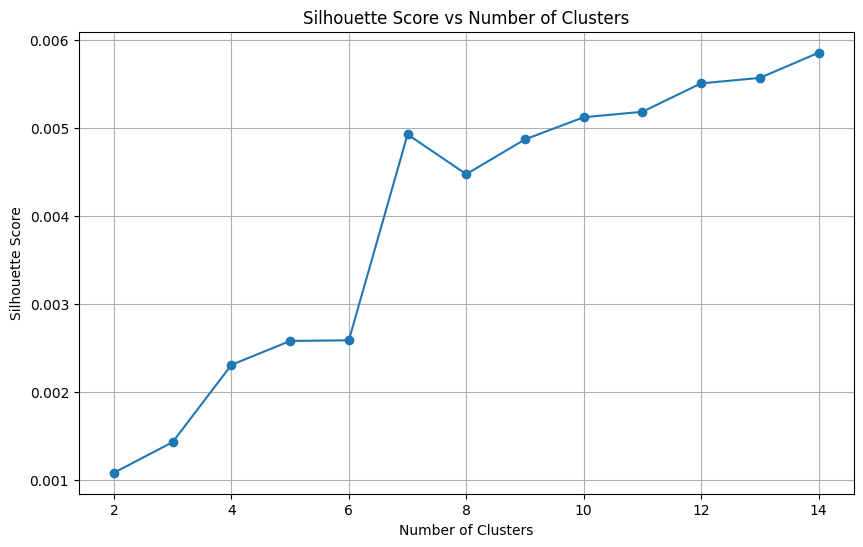

Optimal number of clusters based on largest silhouette score difference: 7


In [18]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []
range_n_clusters = range(2, 15)  # Range of clusters to try

# Compute silhouette scores for different numbers of clusters
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")
    
# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.grid(True)
plt.show()

# Determine the optimal number of clusters based on silhouette score
optimal_n_clusters = None
max_diff = -float('inf')

for i in range(len(silhouette_scores) - 1):
    diff = silhouette_scores[i] - silhouette_scores[i + 1]
    if diff > max_diff:
        max_diff = diff
        optimal_n_clusters = range_n_clusters[i]

if optimal_n_clusters is None:
    optimal_n_clusters = range_n_clusters[-1]

print(f"Optimal number of clusters based on largest silhouette score difference: {optimal_n_clusters}")

In [19]:
# Get clusters
true_k = 7

model = KMeans(n_clusters=true_k, init='k-means++', max_iter=1000, random_state=42)
model.fit(X)

import pickle

filename = "kmeans_across_all_titles" + str(true_k) + ".pkl"
with open("../models/" + filename, "wb" ) as file:
    pickle.dump(model, file)

In [20]:
# Get prediction/ labels
labels = model.labels_
# Create content_cl dataframe with cleaned_title, cluster, and other part of df
contentC1 = pd.DataFrame({
    'video_id': df['video_id'],           
    'cleaned_title': df['cleaned_title'],
    'channelId': df['channelId'],
    'channelTitle': df['channelTitle'],
    'trending_date': df['trending_date'],
    'time_to_trend_hr': df['time_to_trend_hr'],
    'trending_duration_days': df['trending_duration_days'],
    'views': df['views'],
    'LikeRatio1': df['LikeRatio1'],
    'CommentRatio1': df['CommentRatio1'],
    'views_velocity': df['views_velocity'], 
    'comments_polarity': df['comments_polarity'], 
    'cluster': labels                    
})

In [21]:
contentC1

,video_id,cleaned_title,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster
0,hpMeCem6Hss,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,148.29,0.0,1123529,34.97,3.23,1.605041e+05,0.11,4
1,K_uCyxNsHpo,Brooklyns DATES DAYS Meet Jorge Date,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,146.88,0.0,1120675,37.18,4.71,1.600964e+05,0.10,4
2,v97FPN2US2o,Joji Diplo Daylight Official Music Video,UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,128.00,1.0,3363606,82.95,3.95,4.805151e+05,0.06,3
3,czwejgoH3zs,Son lemme teach something new,UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,124.21,0.0,1722152,98.42,4.22,2.870253e+05,0.21,4
4,kz7gHA2N6nQ,Worlds Strongest Man vs Safe unbreakable,UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,123.06,1.0,2542951,21.64,2.28,3.632787e+05,0.12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12359,AYDICzSsjmY,Built LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,11.00,1.0,296206,26.72,1.96,1.481030e+05,0.28,4
12360,8Tt5hh7gVVw,Tested Star Hotels,UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,9.00,1.0,4532769,38.70,2.53,2.266384e+06,0.11,4
12361,8p9NPLvlrv0,Tried Every Airline America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,7.62,1.0,743605,52.14,3.90,3.718025e+05,0.00,4
12362,4MxNTXCRDOs,Family Photo Booth Shopping Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,16.98,0.0,167147,67.81,2.54,1.671470e+05,0.29,4


In [22]:
# Aggregate over 'cluster' to find mean and std
agg_result = contentC1.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count'
}).reset_index()

agg_result = agg_result.round(2)
agg_result.sort_values(by=('video_id', 'count'), ascending=False)


cluster        views              LikeRatio1        CommentRatio1        \
                  mean          std       mean    std          mean   std   
4       4   2635722.17   7990405.87      53.29  32.40          3.68  4.14   
3       3   5766855.41   8192145.42      34.16  32.11          2.55  3.35   
1       1   4893948.04  18792092.19      43.92  22.29          3.83  4.06   
0       0   3170038.35   8886926.72      47.19  22.27          4.13  4.10   
2       2   4204711.19   3794459.58      56.21  15.18          2.57  1.79   
5       5   2457505.18   2927575.64      54.93  24.09          2.60  2.15   
6       6  35861679.13  11411483.28      33.73   4.81          2.77  1.14   

  trending_duration_days       views_velocity             comments_polarity  \
                    mean   std           mean         std              mean   
4                   4.79  2.07      376210.43   799701.43              0.19   
3                   5.22  2.15      816147.62   987963.62              0.20   
1                   5.32  3.58      473484.80  1036899.05              0.16   
0                   5.16  2.53      406135.85   497801.20              0.22   
2                   5.41  2.82      600912.77   462975.08              0.14   
5                   5.21  1.85      354477.70   436539.47              0.18   
6                   7.37  5.38     4837049.20  1672657.02              0.16   

        video_id  
    std    count  
4  0.14    10626  
3  0.13      712  
1  0.12      396  
0  0.13      269  
2  0.11      159  
5  0.13      152  
6  0.09       38

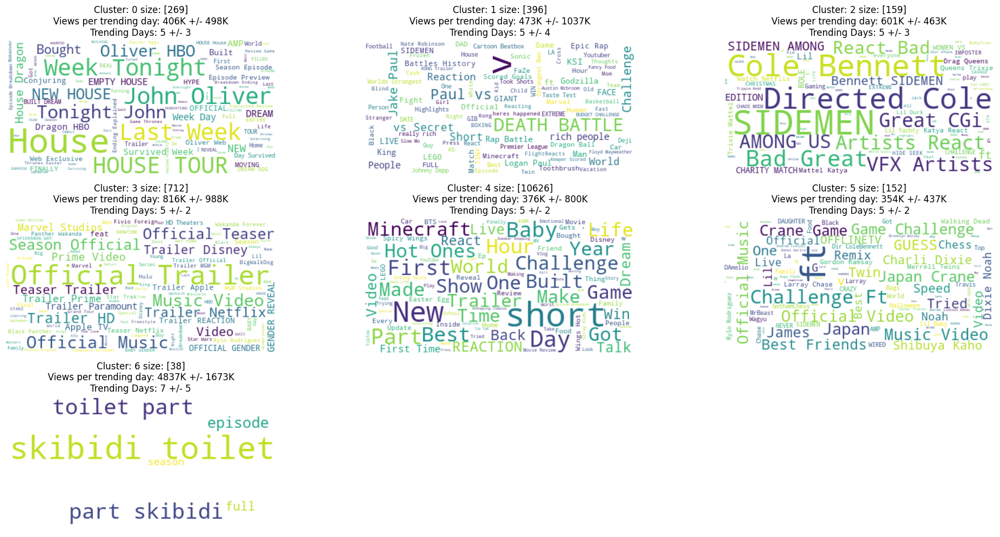

In [23]:
# Determine number of rows and columns dynamically
num_rows = (true_k - 1) // 3 + 1  # 3 columns per row
num_cols = min(true_k, 3)

# Create subplots
plt.figure(figsize=(20, 10))
for k in range(true_k):
    text = contentC1[contentC1.cluster == k]['cleaned_title'].str.cat(sep=' ')
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

    # Create subplot
    ax = plt.subplot(num_rows, num_cols, k + 1)
    ax.set_title("Cluster " + str(k))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")

    # Annotate with mean and std
    count = agg_result.loc[agg_result['cluster'] == k, 'video_id'].values[0]
    mean_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][0] / 10**3).round(0)
    std_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][1] / 10**3).round(0)
    mean_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][0]).round(0)
    std_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][1]).round(0)

    stats_text = f"Views per trending day: {mean_views_vel:.0f}K +/- {std_views_vel:.0f}K\nTrending Days: {mean_trending_days:.0f} +/- {std_trending_days:.0f}"
    ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=12)

plt.tight_layout()
plt.show()

## Clustering Title & Description over the whole period

In [24]:
# Replace None with an empty string
df['cleaned_title'] = df['cleaned_title'].fillna('')
df['cleaned_description'] = df['cleaned_description'].fillna('')

# Concatenate the columns into a single string
df['joined_content'] = df['cleaned_title'] + ' ' + df['cleaned_description']

C:\Users\salto\AppData\Local\Temp\ipykernel_19996\1967408916.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cleaned_title'] = df['cleaned_title'].fillna('')
C:\Users\salto\AppData\Local\Temp\ipykernel_19996\1967408916.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['cleaned_description'] = df['cleaned_description'].fillna('')
C:\Users\salto\AppData\Local\Temp\ipykernel_19996\1967408916.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

In [25]:
df['joined_content'] 

0        FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...
1        Brooklyns DATES DAYS Meet Jorge Date Brooklyn ...
2                Joji Diplo Daylight Official Music Video 
3                           Son lemme teach something new 
4        Worlds Strongest Man vs Safe unbreakable World...
                               ...                        
12359    Built LEGO WATER PARK I built a GIANT Lego wat...
12360                                  Tested Star Hotels 
12361                         Tried Every Airline America 
12362    Family Photo Booth Shopping Town Family Photo ...
12363    Powered Mountain Kelloggs is teaming up with M...
Name: joined_content, Length: 12352, dtype: object

### Vectorizing content

In [26]:
vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,2))  # ngram

X = vectorizer.fit_transform(df['joined_content'])

In [27]:
# Convert the sparse matrix to a DataFrame
pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

,aa,aa bzrp,aa el,aaashleyk,aai,aai bowl,aane,aane se,aap,aap ferg,...,zuckerberg answers,zuko,zuko fights,zuko vs,zurutoys,zurutoys sponsoring,zyromc,zz,zz bassist,zz legend
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12347,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12348,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12349,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12350,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Optimizing number of clusters

For n_clusters = 2, the average silhouette score is : 0.0009446677514337494
For n_clusters = 3, the average silhouette score is : 0.0007612601643803884
For n_clusters = 4, the average silhouette score is : 0.0014467281968030955
For n_clusters = 5, the average silhouette score is : 0.0015152966234467157
For n_clusters = 6, the average silhouette score is : 0.0017166362538229324
For n_clusters = 7, the average silhouette score is : 0.0018622724461704971
For n_clusters = 8, the average silhouette score is : 0.0021827418674087366
For n_clusters = 9, the average silhouette score is : 0.0023177805528495033
For n_clusters = 10, the average silhouette score is : 0.0025281437021171752
For n_clusters = 11, the average silhouette score is : 0.00268171134136166
For n_clusters = 12, the average silhouette score is : 0.0028942963119142394
For n_clusters = 13, the average silhouette score is : 0.0032429019146404396
For n_clusters = 14, the average silhouette score is : 0.003393665944361143


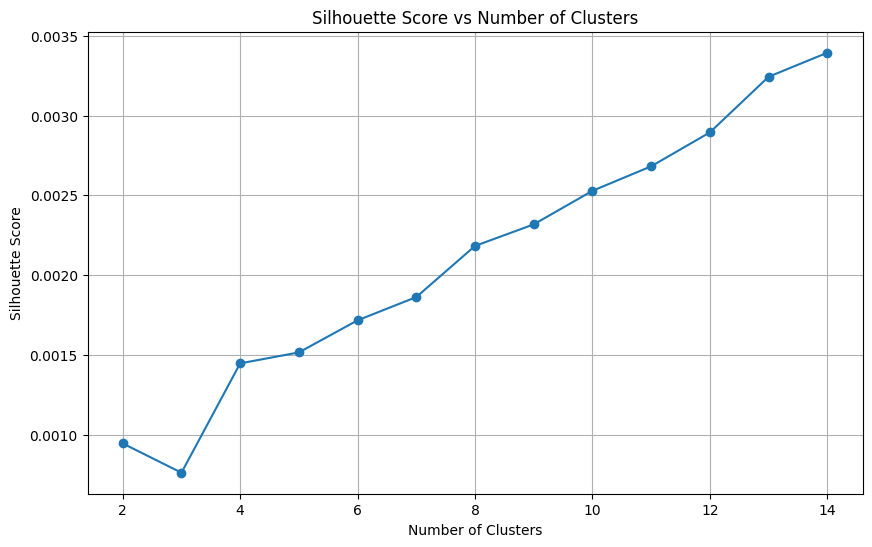

Optimal number of clusters based on largest silhouette score difference: 2


In [28]:
silhouette_scores = []
range_n_clusters = range(2, 15)  # Range of clusters to try

# Compute silhouette scores for different numbers of clusters
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")
    
# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.grid(True)
plt.show()

# Determine the optimal number of clusters based on silhouette score
optimal_n_clusters = None
max_diff = -float('inf')

for i in range(len(silhouette_scores) - 1):
    diff = silhouette_scores[i] - silhouette_scores[i + 1]
    if diff > max_diff:
        max_diff = diff
        optimal_n_clusters = range_n_clusters[i]

if optimal_n_clusters is None:
    optimal_n_clusters = range_n_clusters[-1]

print(f"Optimal number of clusters based on largest silhouette score difference: {optimal_n_clusters}")

In [29]:
# Get clusters
true_k = 7

model = KMeans(n_clusters=true_k, init='k-means++', max_iter=1000, random_state=42)
model.fit(X)

import pickle

filename = "kmeans_across_all_content" + str(true_k) + ".pkl"
with open("../models/" + filename, "wb" ) as file:
    pickle.dump(model, file)

In [30]:
# Get prediction/ labels
labels = model.labels_
# Create content_cl dataframe with cleaned_title, cluster, and other part of df
contentC1 = pd.DataFrame({
    'video_id': df['video_id'],           
    'joined_content': df['joined_content'],
    'channelId': df['channelId'],
    'channelTitle': df['channelTitle'],
    'trending_date': df['trending_date'],
    'time_to_trend_hr': df['time_to_trend_hr'],
    'trending_duration_days': df['trending_duration_days'],
    'views': df['views'],
    'LikeRatio1': df['LikeRatio1'],
    'CommentRatio1': df['CommentRatio1'],
    'views_velocity': df['views_velocity'], 
    'comments_polarity': df['comments_polarity'], 
    'cluster': labels                    
})

In [31]:
contentC1

,video_id,joined_content,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster
0,hpMeCem6Hss,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,148.29,0.0,1123529,34.97,3.23,1.605041e+05,0.11,2
1,K_uCyxNsHpo,Brooklyns DATES DAYS Meet Jorge Date Brooklyn ...,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,146.88,0.0,1120675,37.18,4.71,1.600964e+05,0.10,2
2,v97FPN2US2o,Joji Diplo Daylight Official Music Video,UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,128.00,1.0,3363606,82.95,3.95,4.805151e+05,0.06,3
3,czwejgoH3zs,Son lemme teach something new,UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,124.21,0.0,1722152,98.42,4.22,2.870253e+05,0.21,2
4,kz7gHA2N6nQ,Worlds Strongest Man vs Safe unbreakable World...,UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,123.06,1.0,2542951,21.64,2.28,3.632787e+05,0.12,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12359,AYDICzSsjmY,Built LEGO WATER PARK I built a GIANT Lego wat...,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,11.00,1.0,296206,26.72,1.96,1.481030e+05,0.28,2
12360,8Tt5hh7gVVw,Tested Star Hotels,UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,9.00,1.0,4532769,38.70,2.53,2.266384e+06,0.11,2
12361,8p9NPLvlrv0,Tried Every Airline America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,7.62,1.0,743605,52.14,3.90,3.718025e+05,0.00,2
12362,4MxNTXCRDOs,Family Photo Booth Shopping Town Family Photo ...,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,16.98,0.0,167147,67.81,2.54,1.671470e+05,0.29,4


In [32]:
# Aggregate over 'cluster' to find mean and std
agg_result = contentC1.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count'
}).reset_index()

agg_result = agg_result.round(2)
agg_result.sort_values(by=('video_id', 'count'), ascending=False)


cluster       views              LikeRatio1        CommentRatio1        \
                 mean          std       mean    std          mean   std   
2       2  2889096.20   9035997.07      53.16  32.06          3.65  4.03   
3       3  5033075.32   7792904.83      38.50  32.44          2.78  3.30   
6       6  2550027.26   4297753.52      49.09  26.33          3.75  6.11   
4       4  1909692.60   2731632.30      53.00  32.85          4.00  4.54   
0       0  3093531.94   8749450.78      45.77  22.13          3.96  4.06   
5       5  2852248.71  10476488.31      52.44  30.84          3.86  3.40   
1       1  1880347.65   1663309.04      64.73  31.24          2.69  1.99   

  trending_duration_days       views_velocity            comments_polarity  \
                    mean   std           mean        std              mean   
2                   4.81  2.10      403386.92  875522.00              0.19   
3                   5.17  2.26      713911.69  960208.67              0.19   
6                   5.05  2.22      357249.97  512191.34              0.22   
4                   4.95  1.55      293605.20  422913.88              0.23   
0                   5.07  2.48      400222.60  497680.03              0.22   
5                   5.26  4.30      347918.83  600682.89              0.21   
1                   4.87  1.48      293833.55  230438.17              0.19   

        video_id  
    std    count  
2  0.13    10057  
3  0.13      970  
6  0.13      411  
4  0.17      308  
0  0.13      280  
5  0.14      263  
1  0.09       63

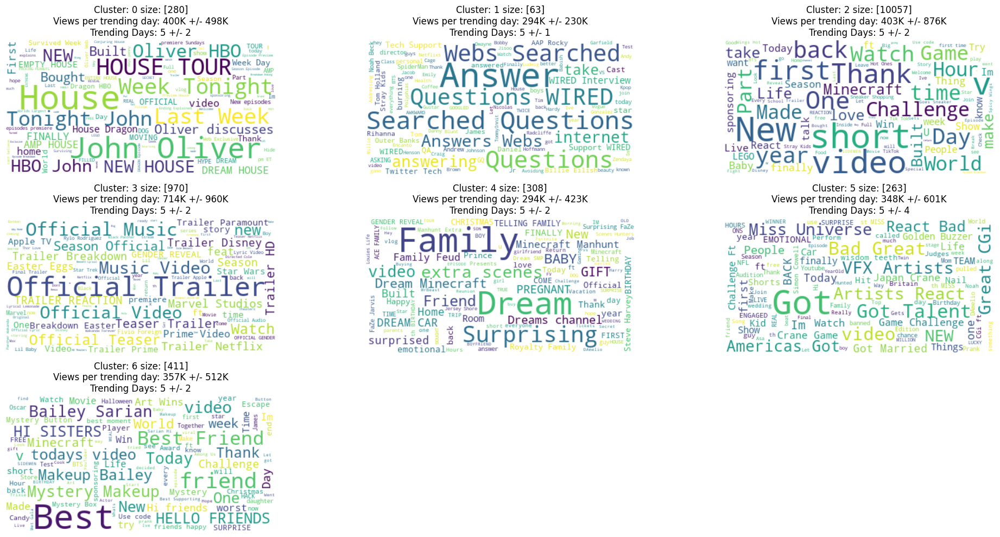

In [33]:
# Determine number of rows and columns dynamically
num_rows = (true_k - 1) // 3 + 1  # 3 columns per row
num_cols = min(true_k, 3)

# Create subplots
plt.figure(figsize=(20, 10))
for k in range(true_k):
    text = contentC1[contentC1.cluster == k]['joined_content'].str.cat(sep=' ')
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

    # Create subplot
    ax = plt.subplot(num_rows, num_cols, k + 1)
    ax.set_title("Cluster " + str(k))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")

    # Annotate with mean and std
    count = agg_result.loc[agg_result['cluster'] == k, 'video_id'].values[0]
    mean_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][0] / 10**3).round(0)
    std_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][1] / 10**3).round(0)
    mean_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][0]).round(0)
    std_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][1]).round(0)

    stats_text = f"Views per trending day: {mean_views_vel:.0f}K +/- {std_views_vel:.0f}K\nTrending Days: {mean_trending_days:.0f} +/- {std_trending_days:.0f}"
    ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=12)

plt.tight_layout()
plt.show()

## Clustering content over monthly intervals

Aggregate Content over monthly Intervals

In [34]:
# Convert trending_date to datetime format
df['trending_date'] = pd.to_datetime(df['trending_date'])

# Extract month and year from trending_date
df['month_year'] = df['trending_date'].dt.to_period('M')

C:\Users\salto\AppData\Local\Temp\ipykernel_19996\2534898922.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['trending_date'] = pd.to_datetime(df['trending_date'])
C:\Users\salto\AppData\Local\Temp\ipykernel_19996\2534898922.py:5: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month_year'] = df['trending_date'].dt.to_period('M')
C:\Users\salto\AppData\Local\Temp\ipykernel_19996\2534898922.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month_

In [35]:


# Function to determine the optimal number of clusters using the elbow method
def find_optimal_k(X):
    
    silhouette_scores = []
    range_n_clusters = range(2, 10)  # Range of clusters to try
    
    # Compute silhouette scores for different numbers of clusters
    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
        cluster_labels = kmeans.fit_predict(X)
        
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_scores.append(silhouette_avg)

   # Determine the optimal number of clusters based on silhouette score
    optimal_n_clusters = None
    max_diff = -float('inf')
    
    for i in range(len(silhouette_scores) - 1):
        diff = silhouette_scores[i] - silhouette_scores[i + 1]
        if diff > max_diff:
            max_diff = diff
            optimal_n_clusters = range_n_clusters[i]
    
    if optimal_n_clusters is None:
        optimal_n_clusters = range_n_clusters[-1]
    
    print(f"Optimal number of clusters based on largest silhouette score difference: {optimal_n_clusters}")
    
    return optimal_n_clusters

# Function to apply clustering to a single monthly subset
def cluster_monthly_data(monthly_df, month):
    # Apply TF-IDF vectorization
    vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,3))
    X = vectorizer.fit_transform(monthly_df['cleaned_title'])
    
    # Determine optimal number of clusters using the elbow method
    optimal_k = find_optimal_k(X)
    
    # Perform KMeans clustering with the optimal number of clusters
    model = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=1000, random_state=42)
    model.fit(X)
    
    filename = f"kmeans_{month}_k{optimal_k}.pkl"
    with open(f"../models/{filename}", "wb") as file:
        pickle.dump(model, file)
        
    # Get prediction/ labels
    labels = model.labels_
    
    # Create content_cl dataframe with cleaned_title, cluster, and other part of monthly_df
    contentC1 = monthly_df.copy()
    contentC1['cluster'] = labels


    # Aggregate over 'cluster' to find mean and std
    agg_result = contentC1.groupby('cluster').agg({
        'views': ['mean', 'std'],
        'LikeRatio1': ['mean', 'std'],
        'CommentRatio1': ['mean', 'std'],
        'trending_duration_days': ['mean', 'std'],
        'views_velocity': ['mean', 'std'],
        'comments_polarity': ['mean', 'std'],
        'video_id': 'count'
    }).reset_index()
        
    agg_result = agg_result.round(2)

    
    return contentC1, agg_result

In [36]:
# Group data by month and apply clustering
monthly_agg_results = []
all_contentC1 = []

for period, monthly_df in df.groupby('month_year'):
    print(f"Processing period: {period}")
    
    # Call the clustering function with the monthly data and period (month_year)
    contentC1, agg_result = cluster_monthly_data(monthly_df, period)  # Pass the period to the function
    
    # Append results as a dictionary
    monthly_agg_results.append({
        'month_year': period,
        'agg_result': agg_result
    })
    
    # Accumulate all contentC1 DataFrames
    all_contentC1.append(contentC1)

# Concatenate all the results
final_agg_results = pd.concat([result['agg_result'].assign(month_year=result['month_year']) for result in monthly_agg_results], ignore_index=True)

# Concatenate all the contentC1 DataFrames
final_contentC1 = pd.concat(all_contentC1, ignore_index=True)

# Sort results by month and cluster count
final_agg_results.sort_values(by=['month_year', ('video_id', 'count')], ascending=[True, False], inplace=True)

# Optionally, you can also sort final_contentC1 if needed
# final_contentC1.sort_values(by='month_year', ascending=True, inplace=True)

Processing period: 2020-08
Optimal number of clusters based on largest silhouette score difference: 4
Processing period: 2020-09
Optimal number of clusters based on largest silhouette score difference: 2
Processing period: 2020-10
Optimal number of clusters based on largest silhouette score difference: 3
Processing period: 2020-11
Optimal number of clusters based on largest silhouette score difference: 7
Processing period: 2020-12
Optimal number of clusters based on largest silhouette score difference: 7
Processing period: 2021-01
Optimal number of clusters based on largest silhouette score difference: 7
Processing period: 2021-02
Optimal number of clusters based on largest silhouette score difference: 6
Processing period: 2021-03
Optimal number of clusters based on largest silhouette score difference: 8
Processing period: 2021-04
Optimal number of clusters based on largest silhouette score difference: 7
Processing period: 2021-05
Optimal number of clusters based on largest silhouette 

In [37]:
final_agg_results

cluster        views              LikeRatio1        CommentRatio1        \
                    mean          std       mean    std          mean   std   
0         0   2482288.25   4600516.16      64.86  36.67          6.03  6.85   
1         1   2820233.81   4942173.35      68.42  42.99          5.71  3.79   
3         3   1947703.92   1609118.88      61.48  38.58          4.98  4.91   
2         2   1347108.44    848025.32      33.68  11.79          7.25  5.85   
5         1   2563703.83   3861691.64      60.16  38.82          5.47  4.46   
..      ...          ...          ...        ...    ...           ...   ...   
225       4  24137314.67  39588042.11      59.60  43.02          2.82  2.06   
228       7   6821000.40   7095819.97      18.36   8.57          1.09  0.61   
224       3   1206146.50    201513.41      38.28  28.20          1.66  0.26   
226       5   1959010.00   1946614.06      28.52  19.33          3.20  0.53   
222       1   1065009.00          NaN      28.23    NaN          0.49   NaN   

    trending_duration_days       views_velocity             comments_polarity  \
                      mean   std           mean         std              mean   
0                     3.98  1.64      404208.96   663617.70              0.14   
1                     3.52  1.46      483822.79   812431.90              0.13   
3                     4.38  1.76      296601.51   207544.97              0.13   
2                     4.00  1.41      220407.85   121748.43              0.07   
5                     4.47  1.22      429321.45   596602.31              0.15   
..                     ...   ...            ...         ...               ...   
225                   6.00  3.41     2830161.59  3449522.36              0.17   
228                   5.20  3.03      819641.79   714809.27              0.15   
224                   4.50  4.95      252200.17   144746.88              0.25   
226                   7.50  0.71      214431.41   220867.36              0.28   
222                   7.00   NaN      133126.12         NaN              0.23   

          video_id month_year  
      std    count             
0    0.13      159    2020-08  
1    0.11       31    2020-08  
3    0.17       13    2020-08  
2    0.08        9    2020-08  
5    0.13      224    2020-09  
..    ...      ...        ...  
225  0.04        6    2024-04  
228  0.12        5    2024-04  
224  0.04        2    2024-04  
226  0.26        2    2024-04  
222   NaN        1    2024-04  

[229 rows x 15 columns]

In [38]:
final_contentC1

,video_id,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cleaned_title,cleaned_description,joined_content,month_year,cluster
0,hpMeCem6Hss,UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,148.29,0.0,1123529,34.97,3.23,1.605041e+05,0.11,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,It is what it is New drop coming this month,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,2020-08,0
1,K_uCyxNsHpo,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,146.88,0.0,1120675,37.18,4.71,1.600964e+05,0.10,Brooklyns DATES DAYS Meet Jorge Date,Brooklyn is going on TEN DATES in TEN DAYS This,Brooklyns DATES DAYS Meet Jorge Date Brooklyn ...,2020-08,0
2,v97FPN2US2o,UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,128.00,1.0,3363606,82.95,3.95,4.805151e+05,0.06,Joji Diplo Daylight Official Music Video,,Joji Diplo Daylight Official Music Video,2020-08,3
3,czwejgoH3zs,UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,124.21,0.0,1722152,98.42,4.22,2.870253e+05,0.21,Son lemme teach something new,,Son lemme teach something new,2020-08,0
4,kz7gHA2N6nQ,UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,123.06,1.0,2542951,21.64,2.28,3.632787e+05,0.12,Worlds Strongest Man vs Safe unbreakable,Worlds Strongest Man vs Safe with Brianna,Worlds Strongest Man vs Safe unbreakable World...,2020-08,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12347,AYDICzSsjmY,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,11.00,1.0,296206,26.72,1.96,1.481030e+05,0.28,Built LEGO WATER PARK,I built a GIANT Lego water park with pools water,Built LEGO WATER PARK I built a GIANT Lego wat...,2024-04,7
12348,8Tt5hh7gVVw,UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,9.00,1.0,4532769,38.70,2.53,2.266384e+06,0.11,Tested Star Hotels,,Tested Star Hotels,2024-04,0
12349,8p9NPLvlrv0,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,7.62,1.0,743605,52.14,3.90,3.718025e+05,0.00,Tried Every Airline America,,Tried Every Airline America,2024-04,0
12350,4MxNTXCRDOs,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,16.98,0.0,167147,67.81,2.54,1.671470e+05,0.29,Family Photo Booth Shopping Town,Family Photo Booth Shopping In Town Ad,Family Photo Booth Shopping Town Family Photo ...,2024-04,0


### Number of Clusters per Month

In [39]:
# Assuming 'month_year' is of PeriodDtype, convert it to datetime
final_contentC1['month_year'] = final_contentC1['month_year'].dt.to_timestamp()

# Count the number of unique clusters per month
clusters_per_month = final_contentC1.groupby('month_year')['cluster'].nunique().reset_index()

# Rename columns for clarity
clusters_per_month.columns = ['month_year', 'number_of_clusters']

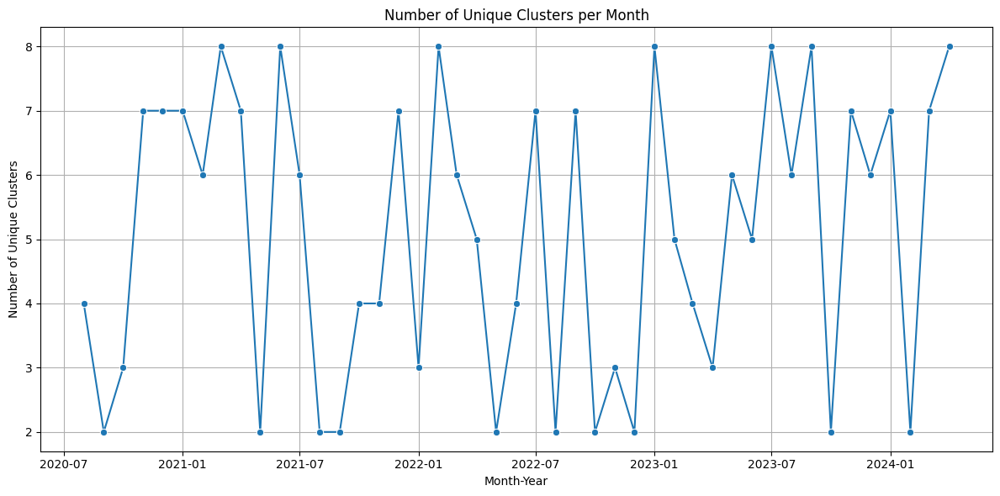

In [40]:
# Plot the number of unique clusters per month
plt.figure(figsize=(12, 6))
sns.lineplot(data=clusters_per_month, x='month_year', y='number_of_clusters', marker='o')
plt.title('Number of Unique Clusters per Month')
plt.xlabel('Month-Year')
plt.ylabel('Number of Unique Clusters')
#plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [41]:
#Flatten column names
final_agg_results.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in final_agg_results.columns]
# Convert 'month_year_' to standard datetime format
final_agg_results['month_year_'] = final_agg_results['month_year_'].dt.to_timestamp()

In [42]:
final_agg_results

,cluster_,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,video_id_count,month_year_
0,0,2482288.25,4600516.16,64.86,36.67,6.03,6.85,3.98,1.64,404208.96,663617.70,0.14,0.13,159,2020-08-01
1,1,2820233.81,4942173.35,68.42,42.99,5.71,3.79,3.52,1.46,483822.79,812431.90,0.13,0.11,31,2020-08-01
3,3,1947703.92,1609118.88,61.48,38.58,4.98,4.91,4.38,1.76,296601.51,207544.97,0.13,0.17,13,2020-08-01
2,2,1347108.44,848025.32,33.68,11.79,7.25,5.85,4.00,1.41,220407.85,121748.43,0.07,0.08,9,2020-08-01
5,1,2563703.83,3861691.64,60.16,38.82,5.47,4.46,4.47,1.22,429321.45,596602.31,0.15,0.13,224,2020-09-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,4,24137314.67,39588042.11,59.60,43.02,2.82,2.06,6.00,3.41,2830161.59,3449522.36,0.17,0.04,6,2024-04-01
228,7,6821000.40,7095819.97,18.36,8.57,1.09,0.61,5.20,3.03,819641.79,714809.27,0.15,0.12,5,2024-04-01
224,3,1206146.50,201513.41,38.28,28.20,1.66,0.26,4.50,4.95,252200.17,144746.88,0.25,0.04,2,2024-04-01
226,5,1959010.00,1946614.06,28.52,19.33,3.20,0.53,7.50,0.71,214431.41,220867.36,0.28,0.26,2,2024-04-01


### Size of Clusters per Month

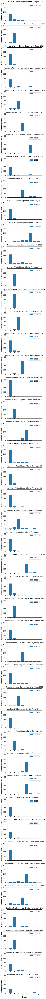

In [43]:
# Plotting bar plots for each month based on video_id_count
months = final_agg_results['month_year_'].unique()

fig, axs = plt.subplots(len(months), 1, figsize=(4, 2 * len(months)), sharex=True, sharey=True)

for i, month in enumerate(months):
    data_month = final_agg_results[final_agg_results['month_year_'] == month]
    data_month = data_month.sort_values(by='cluster_')  # Ensure clusters are sorted for consistent stacking
    
    num_clusters = data_month['cluster_'].nunique()
    xticks = range(num_clusters)
    
    axs[i].bar(xticks, data_month['video_id_count'], label=month.strftime('%Y-%m'))
    axs[i].set_title(f'Number of Video IDs per Cluster for {month.strftime("%B %Y")}', fontsize =10)
    axs[i].set_ylabel('Number of Video Titles')
    axs[i].legend()

    # Set x-axis ticks and labels
    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(data_month['cluster_'].unique(), rotation=0, ha='right')  # Ensure labels are readable

plt.xlabel('Cluster')
plt.tight_layout()
plt.show()

### Leading topics per Month

In [44]:
# Group by 'month_year' and 'cluster' to calculate the size of each cluster
cluster_sizes = final_contentC1.groupby(['month_year', 'cluster']).size().reset_index(name='size')

# Identify the largest cluster for each month
idx = cluster_sizes.groupby(['month_year'])['size'].idxmax()
largest_clusters = cluster_sizes.loc[idx].reset_index(drop=True)

In [45]:
largest_clusters

,month_year,cluster,size
0,2020-08-01,0,159
1,2020-09-01,1,224
2,2020-10-01,0,255
3,2020-11-01,0,174
4,2020-12-01,2,182
5,2021-01-01,3,185
6,2021-02-01,5,200
7,2021-03-01,0,197
8,2021-04-01,3,182
9,2021-05-01,0,246


In [46]:
# For each largest cluster, join the 'cleaned_title' values into a single string
joined_titles_per_month = final_contentC1.groupby(['month_year', 'cluster'])['cleaned_title'].apply(lambda titles: ' '.join(titles)).reset_index()

In [47]:
largest_clusters_df1 = pd.merge(largest_clusters, joined_titles_per_month, on=['month_year','cluster'])

In [48]:
final_agg_results.rename(columns={
    'cluster_': 'cluster',
    'month_year_': 'month_year',
    'video_id_count': 'size'
}, inplace=True)

In [49]:
final_agg_results

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,size,month_year
0,0,2482288.25,4600516.16,64.86,36.67,6.03,6.85,3.98,1.64,404208.96,663617.70,0.14,0.13,159,2020-08-01
1,1,2820233.81,4942173.35,68.42,42.99,5.71,3.79,3.52,1.46,483822.79,812431.90,0.13,0.11,31,2020-08-01
3,3,1947703.92,1609118.88,61.48,38.58,4.98,4.91,4.38,1.76,296601.51,207544.97,0.13,0.17,13,2020-08-01
2,2,1347108.44,848025.32,33.68,11.79,7.25,5.85,4.00,1.41,220407.85,121748.43,0.07,0.08,9,2020-08-01
5,1,2563703.83,3861691.64,60.16,38.82,5.47,4.46,4.47,1.22,429321.45,596602.31,0.15,0.13,224,2020-09-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225,4,24137314.67,39588042.11,59.60,43.02,2.82,2.06,6.00,3.41,2830161.59,3449522.36,0.17,0.04,6,2024-04-01
228,7,6821000.40,7095819.97,18.36,8.57,1.09,0.61,5.20,3.03,819641.79,714809.27,0.15,0.12,5,2024-04-01
224,3,1206146.50,201513.41,38.28,28.20,1.66,0.26,4.50,4.95,252200.17,144746.88,0.25,0.04,2,2024-04-01
226,5,1959010.00,1946614.06,28.52,19.33,3.20,0.53,7.50,0.71,214431.41,220867.36,0.28,0.26,2,2024-04-01


In [50]:
largest_clusters_df = pd.merge(largest_clusters_df1, final_agg_results, on=['month_year','cluster', 'size'])

In [51]:
largest_clusters_df.head(5)

,month_year,cluster,size,cleaned_title,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std
0,2020-08-01,0,159,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,2482288.25,4600516.16,64.86,36.67,6.03,6.85,3.98,1.64,404208.96,663617.70,0.14,0.13
1,2020-09-01,1,224,GHOSTEMANE AI OFFICIAL VIDEO AAP Rocky Answers...,2563703.83,3861691.64,60.16,38.82,5.47,4.46,4.47,1.22,429321.45,596602.31,0.15,0.13
2,2020-10-01,0,255,Addison Rae Mom Awkward Conversations Podcast ...,2539338.83,3708918.41,57.10,36.97,4.71,5.67,4.43,1.37,415158.29,535198.47,0.16,0.12
3,2020-11-01,0,174,TXT Dance Break Ver TOMORROW X TOGETHER COMEBA...,2297894.29,3656499.00,49.75,33.06,4.45,4.52,5.51,1.92,319279.00,455169.70,0.15,0.13
4,2020-12-01,2,182,Fortnite Money Wars PWR Tournament Raising Can...,2401885.42,4061401.54,62.21,36.43,5.90,6.88,5.23,1.48,351439.91,513385.47,0.16,0.13


In [52]:
largest_clusters_df.columns

Index(['month_year', 'cluster', 'size', 'cleaned_title', 'views_mean',
       'views_std', 'LikeRatio1_mean', 'LikeRatio1_std', 'CommentRatio1_mean',
       'CommentRatio1_std', 'trending_duration_days_mean',
       'trending_duration_days_std', 'views_velocity_mean',
       'views_velocity_std', 'comments_polarity_mean',
       'comments_polarity_std'],
      dtype='object')

Top 5 words: ['makeup', 'QA', 'tacodas', 'Full', 'Face']


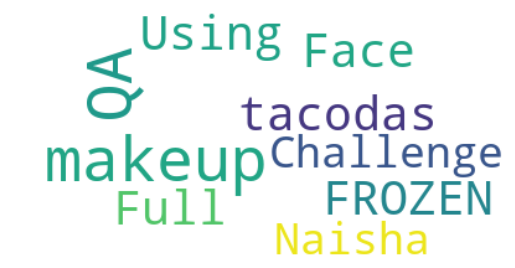

In [53]:
text = joined_titles_per_month['cleaned_title'].iloc[28]
wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")

# Retrieve the first 5 most frequent words
top_words = list(wordcloud.words_.keys())[:5]
print("Top 5 words:", top_words)

In [54]:
# Function to get top 5 words
def get_top_words(text):
    # Generate word cloud
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    
    # Filter out words with 1-2 characters
    filtered_words = {word: freq for word, freq in wordcloud.words_.items() if len(word) > 2}
    
    # Get the top 10 words
    top_words = list(filtered_words.keys())[:5]
    
    return top_words

In [55]:
# Apply function to each month_year group
top_words_per_month = largest_clusters_df.groupby('month_year')['cleaned_title'].apply(lambda x: get_top_words(' '.join(x))).reset_index()

# Rename the column
top_words_per_month.columns = ['month_year', 'top_5_words']

# Merge with largest_clusters_df
largest_clusters_df = pd.merge(largest_clusters_df, top_words_per_month, on='month_year')
largest_clusters_df.head(2)

,month_year,cluster,size,cleaned_title,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,top_5_words
0,2020-08-01,0,159,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,2482288.25,4600516.16,64.86,36.67,6.03,6.85,3.98,1.64,404208.96,663617.70,0.14,0.13,"[new, Date, DAY, Live, House]"
1,2020-09-01,1,224,GHOSTEMANE AI OFFICIAL VIDEO AAP Rocky Answers...,2563703.83,3861691.64,60.16,38.82,5.47,4.46,4.47,1.22,429321.45,596602.31,0.15,0.13,"[First, Official, Video, News, Chadwick Boseman]"


In [56]:
'''
# Filter data for the year 2023
largest_clusters_df_2023 = largest_clusters_df[largest_clusters_df['month_year'].str.startswith('2023')]

# Prepare data for plotting
months = largest_clusters_df_2023['month_year']
top_words = largest_clusters_df_2023['top_10_words']

# Generate a custom palette with 12 colors using seaborn
custom_palette = sns.color_palette("husl", 12)

# Plotting
plt.figure(figsize=(15, 5))

for i, (month, words, color) in enumerate(zip(months, top_words, colors)):
    color = custom_palette[i % 12]  # Cycle through the custom palette
    plt.text(0.1, i, f'{month}: ' + ', '.join(words), fontsize=12, ha='left', va='center', color=color)

plt.xlim(0, 1)
plt.ylim(-1, len(months))
plt.axis('off')
plt.title('Top Words for Each Month in 2023')
#plt.tight_layout()
plt.show()
'''

'\n# Filter data for the year 2023\nlargest_clusters_df_2023 = largest_clusters_df[largest_clusters_df[\'month_year\'].str.startswith(\'2023\')]\n\n# Prepare data for plotting\nmonths = largest_clusters_df_2023[\'month_year\']\ntop_words = largest_clusters_df_2023[\'top_10_words\']\n\n# Generate a custom palette with 12 colors using seaborn\ncustom_palette = sns.color_palette("husl", 12)\n\n# Plotting\nplt.figure(figsize=(15, 5))\n\nfor i, (month, words, color) in enumerate(zip(months, top_words, colors)):\n    color = custom_palette[i % 12]  # Cycle through the custom palette\n    plt.text(0.1, i, f\'{month}: \' + \', \'.join(words), fontsize=12, ha=\'left\', va=\'center\', color=color)\n\nplt.xlim(0, 1)\nplt.ylim(-1, len(months))\nplt.axis(\'off\')\nplt.title(\'Top Words for Each Month in 2023\')\n#plt.tight_layout()\nplt.show()\n'

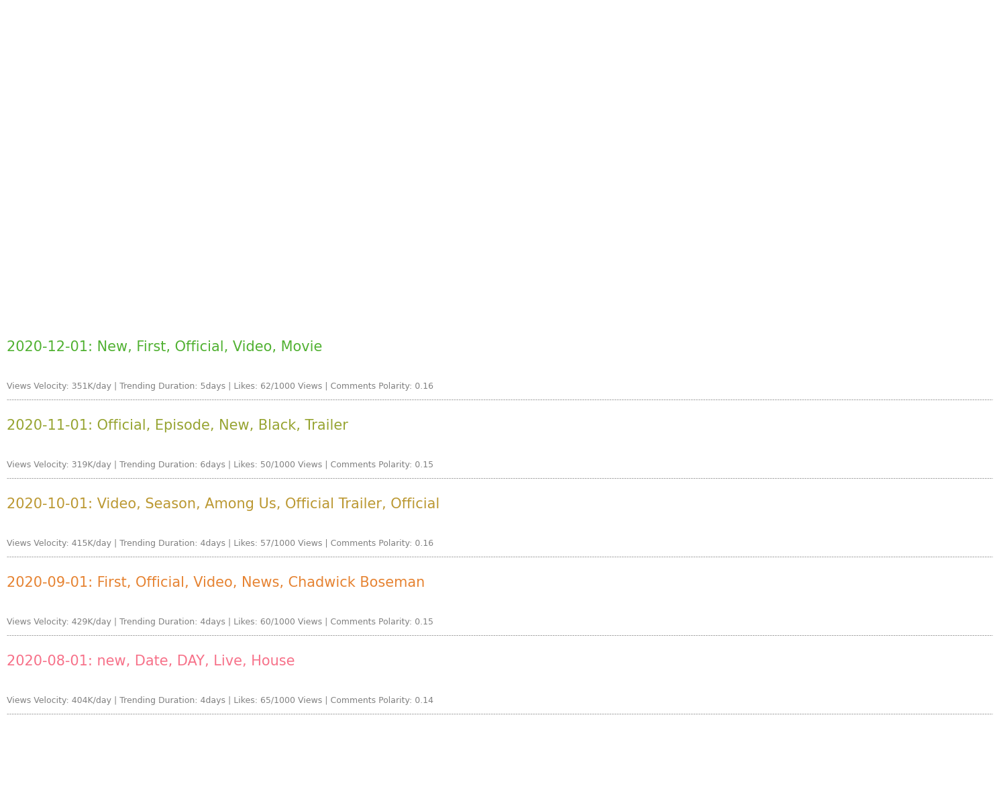

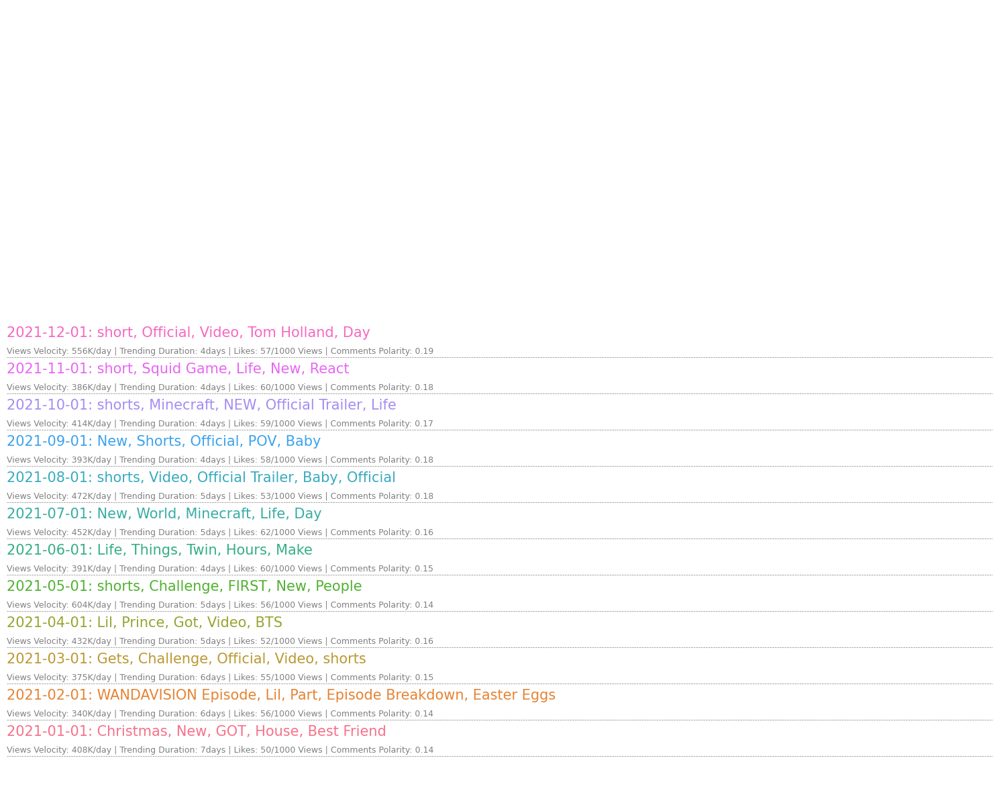

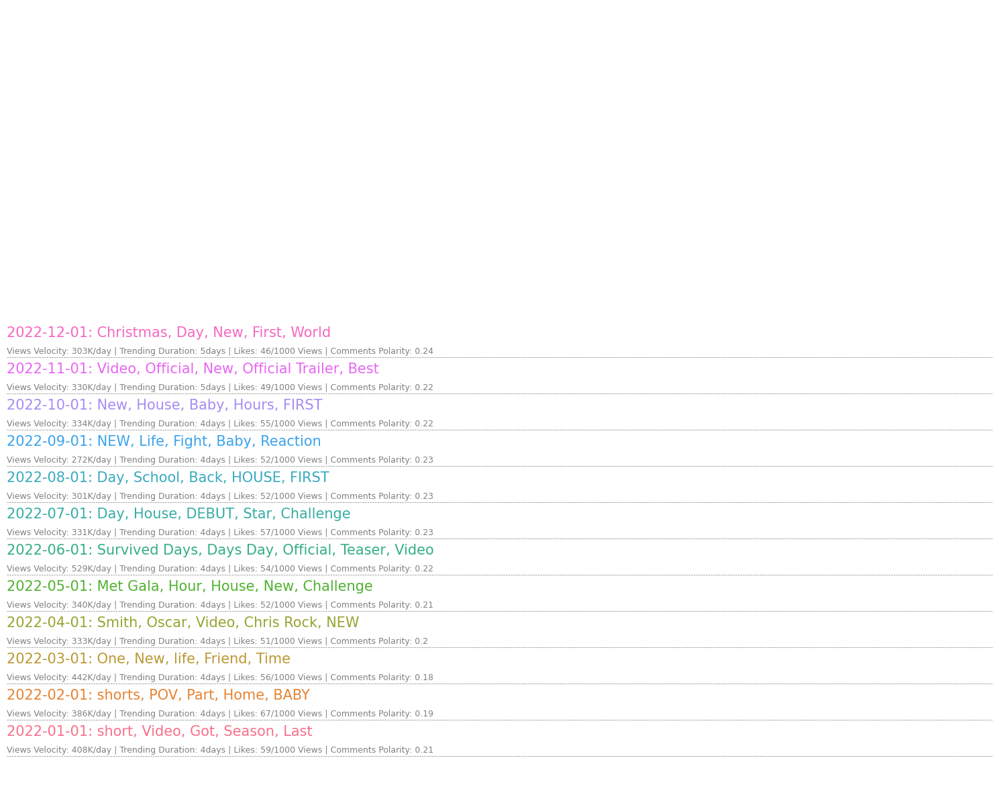

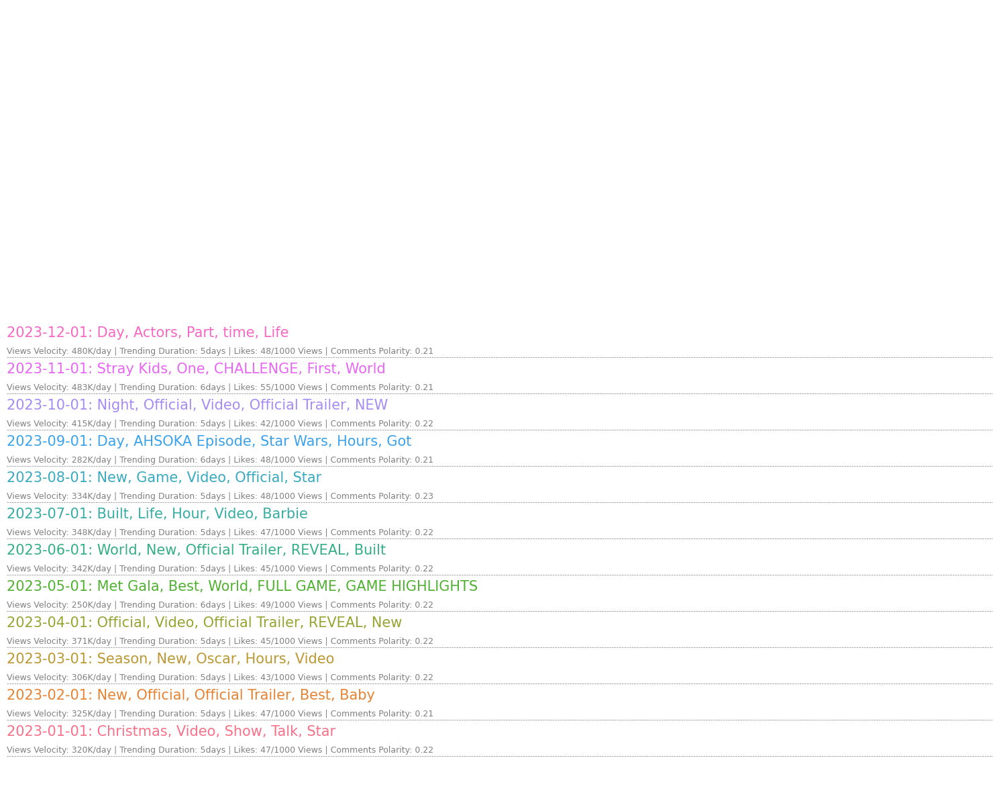

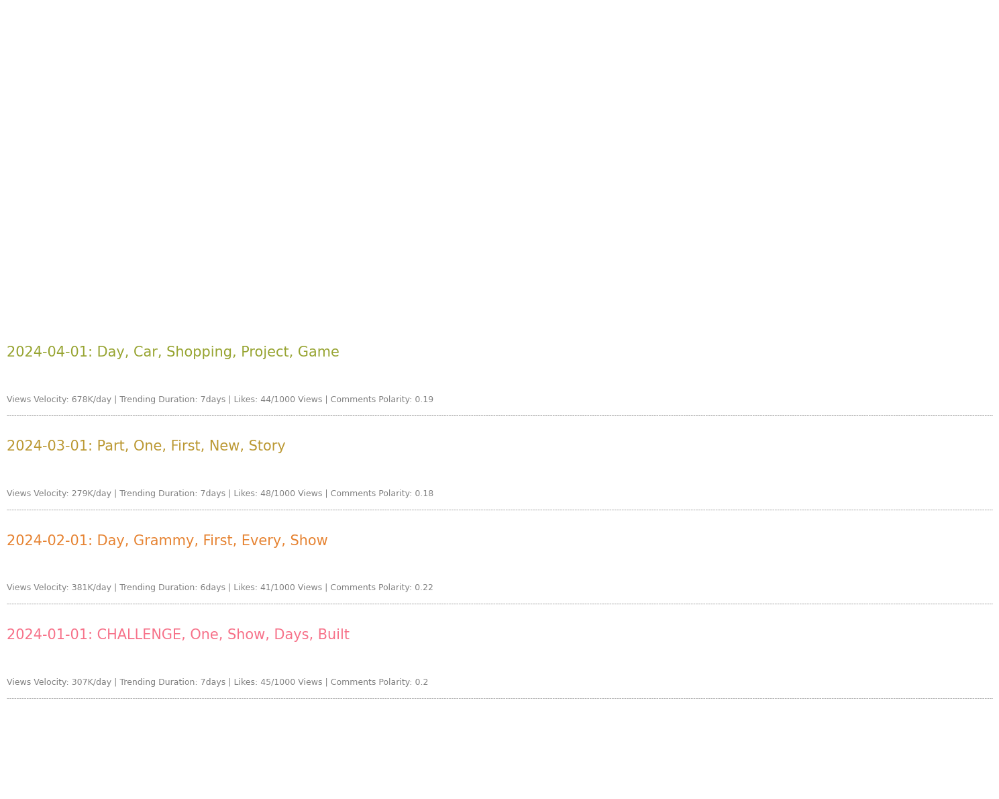

In [57]:
# Ensure 'month_year' column is treated as string
largest_clusters_df['month_year'] = largest_clusters_df['month_year'].astype(str)

# Generate a custom palette with 12 colors using seaborn
custom_palette = sns.color_palette("husl", 12)

# Iterate over each unique year in the DataFrame
unique_years = largest_clusters_df['month_year'].str[:4].unique()

for year in unique_years:
    # Filter data for the specific year
    df_year = largest_clusters_df[largest_clusters_df['month_year'].str.startswith(year)]
    
    # Prepare data for plotting
    months = df_year['month_year']
    top_words = df_year['top_5_words']
    sizes = df_year['size']
    views_velocity_mean = df_year['views_velocity_mean']/1000
    views_velocity_std = df_year['views_velocity_std']/1000
    like_ratio = df_year['LikeRatio1_mean']
    trending_duration_days_mean = df_year['trending_duration_days_mean']
    trending_duration_days_std = df_year['trending_duration_days_std']
    comments_polarity_mean = df_year['comments_polarity_mean']
    comments_polarity_std = df_year['comments_polarity_std']
    
    line_height = 0.6  # Adjust this value to increase/decrease space between lines
    
    # Plotting
    plt.figure(figsize=(15, 12))
    
    for i, (month, words) in enumerate(zip(months, top_words)):
        color = custom_palette[i % 12]  # Cycle through the custom palette
        plt.text(0, i*line_height, f'{month}: ' + ', '.join(words), fontsize=15, ha='left', va='center', color=color)
        # Add a blank line between entries
        plt.axhline(i*line_height -0.4, color='gray', linestyle='--', linewidth=0.5)
    
        info_str = (f'Views Velocity: {views_velocity_mean.iloc[i]:.0f}K/day | Trending Duration: {trending_duration_days_mean.iloc[i]:.0f}days | Likes: {like_ratio.iloc[i]:.0f}/1000 Views | Comments Polarity: {comments_polarity_mean.iloc[i]}')
        plt.text(0, i*line_height-0.3, info_str, fontsize=9, ha='left', va='center', color='gray')
    
    plt.xlim(0, 1)
    plt.ylim(-1, len(months))
    plt.axis('off')
    #plt.title(f'Top Words and Metrics for Each Month in {year}')
    plt.tight_layout()

    
    
    plt.show()

In [58]:
largest_clusters_df.head(2)

,month_year,cluster,size,cleaned_title,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,top_5_words
0,2020-08-01,0,159,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,2482288.25,4600516.16,64.86,36.67,6.03,6.85,3.98,1.64,404208.96,663617.70,0.14,0.13,"[new, Date, DAY, Live, House]"
1,2020-09-01,1,224,GHOSTEMANE AI OFFICIAL VIDEO AAP Rocky Answers...,2563703.83,3861691.64,60.16,38.82,5.47,4.46,4.47,1.22,429321.45,596602.31,0.15,0.13,"[First, Official, Video, News, Chadwick Boseman]"


In [59]:
import plotly.express as px
import plotly.io as pio

# Assuming largest_clusters_df has 'month_year', 'size', and 'views_velocity_mean' columns

# Convert 'month_year' to datetime if it's not already in datetime format
largest_clusters_df['month_year'] = pd.to_datetime(largest_clusters_df['month_year'])
# Extracting the year
largest_clusters_df['year'] = largest_clusters_df['month_year'].dt.year

# Create a bubble plot
fig = px.scatter(
    largest_clusters_df,
    x='month_year',
    y='views_velocity_mean',
    size='size',
    color='trending_duration_days_mean', 
    hover_name='year',
    hover_data={'trending_duration_days_mean': ':.1f', 'size': True, 'top_5_words': True, 'views_velocity_mean': ':.0f'},
    title='Leading Topics Over Time',
    labels={'month_year': 'Month-Year', 'size': 'Titles', 'trending_duration_days_mean': 'Days Trending', 'top_5_words': 'Top 5 words', 'views_velocity_mean': 'Mean Views per trending day'}, 
    size_max=70,  # Max size of bubbles
    width=1300,  # Overall figure width
    height=600,  # Overall figure height
    color_continuous_scale='viridis'
)

# Customize layout
fig.update_traces(marker=dict(sizemode='area', sizeref=1.5*max(largest_clusters_df['size'])/(40.**2), line_width=2))

# Update x-axis title
fig.update_xaxes(title_text='Month-Year')

# Update legend title
fig.update_layout(
    legend_title_text='Year'
)

html_file_path = '../images/Leading_topics_month.html'
pio.write_html(fig, html_file_path, auto_open=False)

fig.show()



# Behavioral Clustering

## Clustering engagement over the whole period

In [60]:
engagement_df = df.copy()

In [61]:
# List of numerical features corresponding to engagement, content and video identifiers
features = df[['video_id', 'channelId', 'channelTitle', 'trending_date', 'trending_duration_days', 
               'cleaned_title', 'views', 'views_velocity', 'LikeRatio1', 'CommentRatio1', 'comments_polarity']]

In [62]:
features.isnull().sum()

video_id                   0
channelId                  0
channelTitle               0
trending_date              0
trending_duration_days     0
cleaned_title              0
views                      0
views_velocity             0
LikeRatio1                 0
CommentRatio1              0
comments_polarity         76
dtype: int64

In [63]:
features.dropna(subset='comments_polarity', inplace = True)

C:\Users\salto\AppData\Local\Temp\ipykernel_19996\1914446357.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [64]:
features.reset_index(drop=True, inplace=True)

In [65]:
features

,video_id,channelId,channelTitle,trending_date,trending_duration_days,cleaned_title,views,views_velocity,LikeRatio1,CommentRatio1,comments_polarity
0,hpMeCem6Hss,UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,0.0,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,1123529,1.605041e+05,34.97,3.23,0.11
1,K_uCyxNsHpo,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,0.0,Brooklyns DATES DAYS Meet Jorge Date,1120675,1.600964e+05,37.18,4.71,0.10
2,v97FPN2US2o,UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,1.0,Joji Diplo Daylight Official Music Video,3363606,4.805151e+05,82.95,3.95,0.06
3,czwejgoH3zs,UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,0.0,Son lemme teach something new,1722152,2.870253e+05,98.42,4.22,0.21
4,kz7gHA2N6nQ,UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,1.0,Worlds Strongest Man vs Safe unbreakable,2542951,3.632787e+05,21.64,2.28,0.12
...,...,...,...,...,...,...,...,...,...,...,...
12271,AYDICzSsjmY,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,1.0,Built LEGO WATER PARK,296206,1.481030e+05,26.72,1.96,0.28
12272,8Tt5hh7gVVw,UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,1.0,Tested Star Hotels,4532769,2.266384e+06,38.70,2.53,0.11
12273,8p9NPLvlrv0,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,1.0,Tried Every Airline America,743605,3.718025e+05,52.14,3.90,0.00
12274,4MxNTXCRDOs,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,0.0,Family Photo Booth Shopping Town,167147,1.671470e+05,67.81,2.54,0.29


In [66]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12276 entries, 0 to 12275
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                12276 non-null  object             
 1   channelId               12276 non-null  object             
 2   channelTitle            12276 non-null  object             
 3   trending_date           12276 non-null  datetime64[ns, UTC]
 4   trending_duration_days  12276 non-null  float64            
 5   cleaned_title           12276 non-null  object             
 6   views                   12276 non-null  int64              
 7   views_velocity          12276 non-null  float64            
 8   LikeRatio1              12276 non-null  float64            
 9   CommentRatio1           12276 non-null  float64            
 10  comments_polarity       12276 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(5), in

In [67]:
features.columns

Index(['video_id', 'channelId', 'channelTitle', 'trending_date',
       'trending_duration_days', 'cleaned_title', 'views', 'views_velocity',
       'LikeRatio1', 'CommentRatio1', 'comments_polarity'],
      dtype='object')

In [68]:
columns_to_drop = ['video_id', 'channelId', 'channelTitle', 'trending_date', 'trending_duration_days', 'cleaned_title', 'views_velocity']
engagement_features = features.drop(columns=columns_to_drop)

In [69]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(engagement_features)
X = scaled_features
X

array([[-0.21601979, -0.52971029, -0.09476455, -0.61566173],
       [-0.21634547, -0.46053048,  0.26945117, -0.68976351],
       [ 0.03960779,  0.97221144,  0.08242147, -0.98617065],
       ...,
       [-0.25937502,  0.00776358,  0.07011689, -1.43078137],
       [-0.32515783,  0.49828282, -0.26456782,  0.71817041],
       [ 0.0058216 ,  1.13060502,  0.16855357,  1.2368829 ]])

### Optimizing number of clusters

For n_clusters = 2, the average silhouette score is : 0.2955660993982209
For n_clusters = 3, the average silhouette score is : 0.3128800293524124
For n_clusters = 4, the average silhouette score is : 0.2656961246856508
For n_clusters = 5, the average silhouette score is : 0.26721533390196844
For n_clusters = 6, the average silhouette score is : 0.2782949679385788
For n_clusters = 7, the average silhouette score is : 0.22652218572489943
For n_clusters = 8, the average silhouette score is : 0.23020663068920388
For n_clusters = 9, the average silhouette score is : 0.2467023957018125
For n_clusters = 10, the average silhouette score is : 0.23635711706948556
For n_clusters = 11, the average silhouette score is : 0.23127146881950203
For n_clusters = 12, the average silhouette score is : 0.23161990892938275
For n_clusters = 13, the average silhouette score is : 0.2356162465138596
For n_clusters = 14, the average silhouette score is : 0.2371731144771706


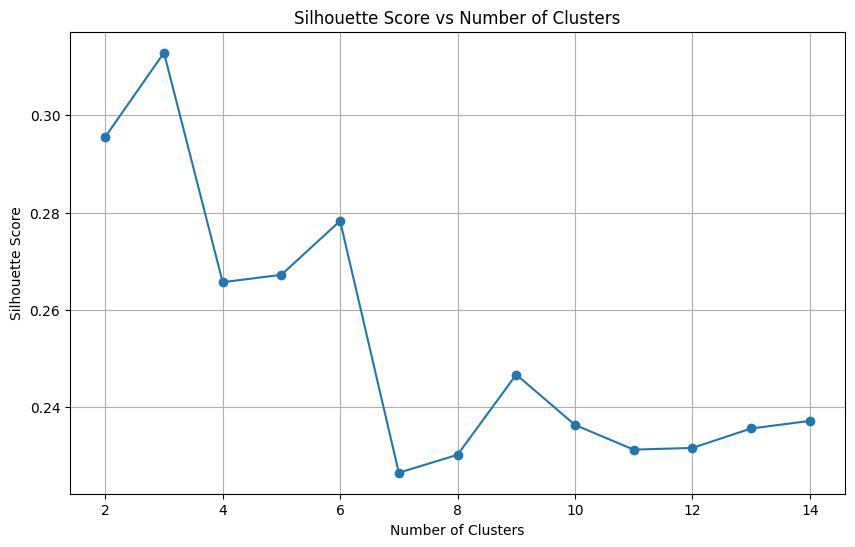

Optimal number of clusters based on largest silhouette score difference: 6


In [70]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

silhouette_scores = []
range_n_clusters = range(2, 15)  # Range of clusters to try

# Compute silhouette scores for different numbers of clusters
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, n_init=10, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")
    
# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.grid(True)
plt.show()

# Determine the optimal number of clusters based on silhouette score
optimal_n_clusters = None
max_diff = -float('inf')

for i in range(len(silhouette_scores) - 1):
    diff = silhouette_scores[i] - silhouette_scores[i + 1]
    if diff > max_diff:
        max_diff = diff
        optimal_n_clusters = range_n_clusters[i]

if optimal_n_clusters is None:
    optimal_n_clusters = range_n_clusters[-1]

print(f"Optimal number of clusters based on largest silhouette score difference: {optimal_n_clusters}")

In [71]:
# Get clusters
true_k = 6

model = KMeans(n_clusters=true_k, init='k-means++', max_iter=1000,  n_init=10, random_state=42)
model.fit(X)

import pickle

filename = "behavioral_kmeans_across_all_titles" + str(true_k) + ".pkl"
with open("../models/" + filename, "wb" ) as file:
    pickle.dump(model, file)

# Get prediction/ labels
labels = model.labels_
len(labels)

12276

In [72]:
engagement_clusters = pd.DataFrame({
    'video_id': features['video_id'],           
    'cleaned_title': features['cleaned_title'],
    'channelId': features['channelId'],
    'channelTitle': features['channelTitle'],
    'trending_date': features['trending_date'],
    'trending_duration_days': features['trending_duration_days'],
    'views': features['views'],
    'LikeRatio1': features['LikeRatio1'],
    'CommentRatio1': features['CommentRatio1'],
    'views_velocity': features['views_velocity'], 
    'comments_polarity': features['comments_polarity'], 
    'cluster': labels                    
})

engagement_clusters

,video_id,cleaned_title,channelId,channelTitle,trending_date,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster
0,hpMeCem6Hss,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,0.0,1123529,34.97,3.23,1.605041e+05,0.11,4
1,K_uCyxNsHpo,Brooklyns DATES DAYS Meet Jorge Date,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,0.0,1120675,37.18,4.71,1.600964e+05,0.10,4
2,v97FPN2US2o,Joji Diplo Daylight Official Music Video,UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,1.0,3363606,82.95,3.95,4.805151e+05,0.06,1
3,czwejgoH3zs,Son lemme teach something new,UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,0.0,1722152,98.42,4.22,2.870253e+05,0.21,1
4,kz7gHA2N6nQ,Worlds Strongest Man vs Safe unbreakable,UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,1.0,2542951,21.64,2.28,3.632787e+05,0.12,4
...,...,...,...,...,...,...,...,...,...,...,...,...
12271,AYDICzSsjmY,Built LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,1.0,296206,26.72,1.96,1.481030e+05,0.28,0
12272,8Tt5hh7gVVw,Tested Star Hotels,UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,1.0,4532769,38.70,2.53,2.266384e+06,0.11,4
12273,8p9NPLvlrv0,Tried Every Airline America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,1.0,743605,52.14,3.90,3.718025e+05,0.00,4
12274,4MxNTXCRDOs,Family Photo Booth Shopping Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,0.0,167147,67.81,2.54,1.671470e+05,0.29,0


## Engaged Topics

In [73]:
engagement_clusters.columns

Index(['video_id', 'cleaned_title', 'channelId', 'channelTitle',
       'trending_date', 'trending_duration_days', 'views', 'LikeRatio1',
       'CommentRatio1', 'views_velocity', 'comments_polarity', 'cluster'],
      dtype='object')

In [74]:
agg_result = engagement_clusters.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count',
    'cleaned_title': lambda x: ' '.join(x)   
}).reset_index()

#agg_result = agg_result.round(2)

In [75]:
# Flatten the MultiIndex columns
agg_result.columns = ['_'.join(col).strip('_') for col in agg_result.columns.values]

# Rename the cleaned_title_ column to just cleaned_title
agg_result.rename(columns={'cleaned_title_<lambda>': 'cleaned_title'}, inplace=True)

agg_result

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,video_id_count,cleaned_title
0,0,1.942309e+06,2.454613e+06,38.293069,18.818509,2.570843,1.929211,4.816260,1.864712,3.063190e+05,3.877434e+05,0.319224,0.085317,4305,Proposal Part Said Yes BABY BOY OFFICIAL LABOR...
1,1,1.697523e+06,2.047980e+06,90.421659,25.029838,4.887106,2.826258,4.488467,1.438174,2.874852e+05,3.451348e+05,0.171868,0.105006,2688,Joji Diplo Daylight Official Music Video Son l...
2,2,1.212244e+08,3.094584e+07,38.090488,14.928001,1.069756,0.966265,19.195122,12.812532,7.873107e+06,4.420017e+06,0.155854,0.149566,41,impossible Behind scenes shorts broke finger B...
3,3,1.801248e+06,3.258085e+06,100.976684,53.566645,19.142725,9.847118,4.598972,1.606558,2.889883e+05,4.884549e+05,0.188021,0.140316,389,TREASURE BOY MV toys evaporate ADHD body Fixin...
4,4,2.202084e+06,2.566264e+06,38.856327,18.100510,2.637259,2.013752,4.891461,1.860529,3.445331e+05,4.008870e+05,0.089653,0.082218,4579,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...
5,5,3.048177e+07,1.211497e+07,37.796314,22.170771,2.220036,1.900541,7.032847,4.155716,3.882453e+06,1.620864e+06,0.160584,0.122183,274,Spent Lottery Tickets Bought Private Island La...


In [76]:
agg_result.loc[agg_result['cluster'] == 0, 'views_velocity_mean'].values[0]

np.float64(306319.03743647115)

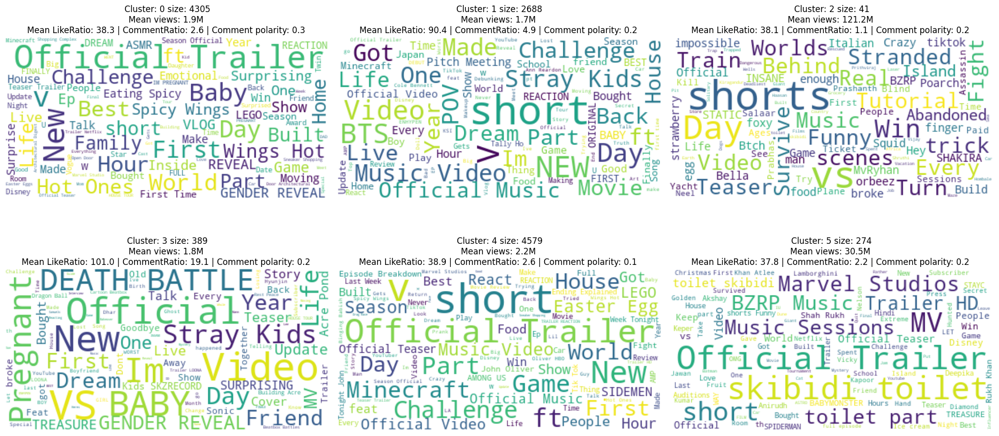

In [77]:
# Determine number of rows and columns dynamically
num_rows = (true_k - 1) // 3 + 1  # 3 columns per row
num_cols = min(true_k, 3)

# Create subplots
plt.figure(figsize=(20, 10))
for k in range(true_k):
    text = agg_result[agg_result.cluster == k]['cleaned_title'].str.cat(sep=' ')
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

    # Create subplot
    ax = plt.subplot(num_rows, num_cols, k + 1)
    ax.set_title("Cluster " + str(k))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")

    # Annotate with mean and std
    count = agg_result.loc[agg_result['cluster'] == k, 'video_id_count'].values[0]
    mean_views = agg_result.loc[agg_result['cluster'] == k, 'views_mean'].values[0] / 10**6
    
    mean_likeratio = agg_result.loc[agg_result['cluster'] == k, 'LikeRatio1_mean'].values[0]
    mean_commentratio = agg_result.loc[agg_result['cluster'] == k, 'CommentRatio1_mean'].values[0]
    mean_commentpolarity = agg_result.loc[agg_result['cluster'] == k, 'comments_polarity_mean'].values[0]

    stats_text = f"Mean views: {mean_views:.1f}M \nMean LikeRatio: {mean_likeratio:.1f} | CommentRatio: {mean_commentratio:.1f} | Comment polarity: {mean_commentpolarity:.1f} "
    ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=12)

plt.tight_layout()
plt.show()

# Textual and Behavioral clustering

What are the most engaged topics?

In [78]:
features.columns

Index(['video_id', 'channelId', 'channelTitle', 'trending_date',
       'trending_duration_days', 'cleaned_title', 'views', 'views_velocity',
       'LikeRatio1', 'CommentRatio1', 'comments_polarity'],
      dtype='object')

In [79]:
columns_to_drop = ['video_id', 'channelId', 'channelTitle', 'trending_date', 'trending_duration_days', 'cleaned_title', 'views_velocity']
engagement_features = features.drop(columns=columns_to_drop)
engagement_features

,views,LikeRatio1,CommentRatio1,comments_polarity
0,1123529,34.97,3.23,0.11
1,1120675,37.18,4.71,0.10
2,3363606,82.95,3.95,0.06
3,1722152,98.42,4.22,0.21
4,2542951,21.64,2.28,0.12
...,...,...,...,...
12271,296206,26.72,1.96,0.28
12272,4532769,38.70,2.53,0.11
12273,743605,52.14,3.90,0.00
12274,167147,67.81,2.54,0.29


In [80]:
# Initialize the scaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(engagement_features)
X1 = scaled_features
X1

array([[-0.21601979, -0.52971029, -0.09476455, -0.61566173],
       [-0.21634547, -0.46053048,  0.26945117, -0.68976351],
       [ 0.03960779,  0.97221144,  0.08242147, -0.98617065],
       ...,
       [-0.25937502,  0.00776358,  0.07011689, -1.43078137],
       [-0.32515783,  0.49828282, -0.26456782,  0.71817041],
       [ 0.0058216 ,  1.13060502,  0.16855357,  1.2368829 ]])

In [81]:
features['cleaned_title']

0        FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...
1                     Brooklyns DATES DAYS Meet Jorge Date
2                 Joji Diplo Daylight Official Music Video
3                            Son lemme teach something new
4                 Worlds Strongest Man vs Safe unbreakable
                               ...                        
12271                                Built LEGO WATER PARK
12272                                   Tested Star Hotels
12273                          Tried Every Airline America
12274                     Family Photo Booth Shopping Town
12275                                     Powered Mountain
Name: cleaned_title, Length: 12276, dtype: object

In [82]:
vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,2))  # ngram

X2 = vectorizer.fit_transform(features['cleaned_title'])

In [83]:
# Convert the sparse matrix to a DataFrame
pd.DataFrame(X2.toarray(), columns=vectorizer.get_feature_names_out())

,aa,aa bzrp,aa el,aai,aai bowl,aap,aap ferg,aap rocky,aaron,aaron carter,...,zs fault,zsazsa,zsazsa conrad,zuckerberg,zuckerberg answers,zuko,zuko fights,zuko vs,zz,zz legend
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12271,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12272,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12273,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
12274,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [84]:
from scipy.sparse import hstack

X= hstack([X1, X2])

In [85]:
X

<COOrdinate sparse matrix of dtype 'float64'
	with 166115 stored elements and shape (12276, 49724)>

For n_clusters = 2, the average silhouette score is : 0.21345491269077296
For n_clusters = 3, the average silhouette score is : 0.16322259546938497
For n_clusters = 4, the average silhouette score is : 0.16968570632338156
For n_clusters = 5, the average silhouette score is : 0.16565017681165187
For n_clusters = 6, the average silhouette score is : 0.15451495422532405
For n_clusters = 7, the average silhouette score is : 0.1274242148813523
For n_clusters = 8, the average silhouette score is : 0.13048310249279063
For n_clusters = 9, the average silhouette score is : 0.12963124211650282
For n_clusters = 10, the average silhouette score is : 0.12951006390254263
For n_clusters = 11, the average silhouette score is : 0.119872744921127
For n_clusters = 12, the average silhouette score is : 0.11388970555713493
For n_clusters = 13, the average silhouette score is : 0.11006634812856196
For n_clusters = 14, the average silhouette score is : 0.10236788387201524


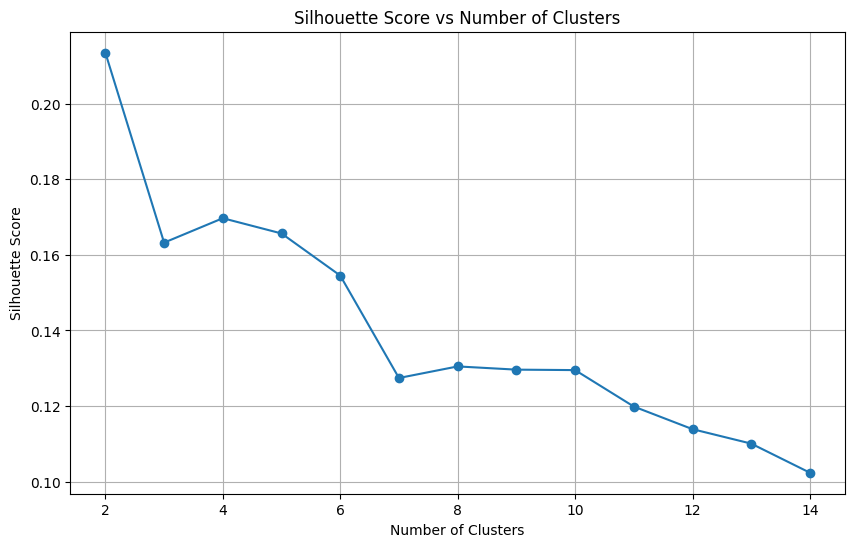

Optimal number of clusters based on largest silhouette score difference: 2


In [86]:
silhouette_scores = []
range_n_clusters = range(2, 15)  # Range of clusters to try

# Compute silhouette scores for different numbers of clusters
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"For n_clusters = {n_clusters}, the average silhouette score is : {silhouette_avg}")
    
# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score vs Number of Clusters')
plt.grid(True)
plt.show()

# Determine the optimal number of clusters based on silhouette score
optimal_n_clusters = None
max_diff = -float('inf')

for i in range(len(silhouette_scores) - 1):
    diff = silhouette_scores[i] - silhouette_scores[i + 1]
    if diff > max_diff:
        max_diff = diff
        optimal_n_clusters = range_n_clusters[i]

if optimal_n_clusters is None:
    optimal_n_clusters = range_n_clusters[-1]

print(f"Optimal number of clusters based on largest silhouette score difference: {optimal_n_clusters}")

In [87]:
# Get clusters
true_k = 6

model = KMeans(n_clusters=true_k, init='k-means++', max_iter=1000, random_state=42)
model.fit(X)

import pickle

# Get prediction/ labels
labels = model.labels_
len(labels)

filename = "kmeans_across_all_features" + str(true_k) + ".pkl"
with open("../models/" + filename, "wb" ) as file:
    pickle.dump(model, file)

In [88]:
engagement_clusters = pd.DataFrame({
    'video_id': features['video_id'],           
    'cleaned_title': features['cleaned_title'],
    'channelId': features['channelId'],
    'channelTitle': features['channelTitle'],
    'trending_date': features['trending_date'],
    'trending_duration_days': features['trending_duration_days'],
    'views': features['views'],
    'LikeRatio1': features['LikeRatio1'],
    'CommentRatio1': features['CommentRatio1'],
    'views_velocity': features['views_velocity'], 
    'comments_polarity': features['comments_polarity'], 
    'cluster': labels                    
})

engagement_clusters

,video_id,cleaned_title,channelId,channelTitle,trending_date,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster
0,hpMeCem6Hss,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...,UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,0.0,1123529,34.97,3.23,1.605041e+05,0.11,1
1,K_uCyxNsHpo,Brooklyns DATES DAYS Meet Jorge Date,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,0.0,1120675,37.18,4.71,1.600964e+05,0.10,1
2,v97FPN2US2o,Joji Diplo Daylight Official Music Video,UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,1.0,3363606,82.95,3.95,4.805151e+05,0.06,2
3,czwejgoH3zs,Son lemme teach something new,UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,0.0,1722152,98.42,4.22,2.870253e+05,0.21,2
4,kz7gHA2N6nQ,Worlds Strongest Man vs Safe unbreakable,UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,1.0,2542951,21.64,2.28,3.632787e+05,0.12,1
...,...,...,...,...,...,...,...,...,...,...,...,...
12271,AYDICzSsjmY,Built LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,1.0,296206,26.72,1.96,1.481030e+05,0.28,0
12272,8Tt5hh7gVVw,Tested Star Hotels,UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,1.0,4532769,38.70,2.53,2.266384e+06,0.11,1
12273,8p9NPLvlrv0,Tried Every Airline America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,1.0,743605,52.14,3.90,3.718025e+05,0.00,1
12274,4MxNTXCRDOs,Family Photo Booth Shopping Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,0.0,167147,67.81,2.54,1.671470e+05,0.29,0


In [89]:
engagement_clusters[engagement_clusters['cluster'] == 6]

,video_id,cleaned_title,channelId,channelTitle,trending_date,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster


In [90]:
agg_result = engagement_clusters.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count',
    'cleaned_title': lambda x: ' '.join(x)   
}).reset_index()

#agg_result = agg_result.round(2)

In [91]:
# Flatten the MultiIndex columns
agg_result.columns = ['_'.join(col).strip('_') for col in agg_result.columns.values]

# Rename the cleaned_title_ column to just cleaned_title
agg_result.rename(columns={'cleaned_title_<lambda>': 'cleaned_title'}, inplace=True)

agg_result

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,video_id_count,cleaned_title
0,0,2.327339e+06,4.097224e+06,37.279320,18.618800,2.512463,1.839489,4.852765,1.936890,3.582476e+05,5.930792e+05,0.322502,0.084983,4177,Proposal Part Said Yes BABY BOY OFFICIAL LABOR...
1,1,3.398899e+06,6.221786e+06,35.669219,16.626279,2.521671,1.912435,5.024776,2.087783,4.956631e+05,8.386002e+05,0.088320,0.083152,4238,FOUGHT BRYCE HALLFt Mike Majlak Lana Rhoades S...
2,2,1.887614e+06,2.778367e+06,82.638164,21.558841,3.694974,1.991770,4.506041,1.458702,3.127752e+05,4.216218e+05,0.162133,0.097991,2897,Joji Diplo Daylight Official Music Video Son l...
3,3,1.050834e+08,3.701644e+07,39.337544,16.543951,1.329649,1.152015,16.315789,12.192149,7.555481e+06,3.950346e+06,0.151228,0.143378,57,Spent Hours Buried Alive impossible Behind sce...
4,4,2.300996e+06,3.631435e+06,111.617460,56.496581,36.084286,14.494525,4.873016,1.921794,3.399202e+05,5.086396e+05,0.203175,0.135573,63,Heres Sponsored Videos Thoughts Liam Payne Tik...
5,5,1.542477e+06,2.817935e+06,96.525190,44.760499,12.018791,3.773612,4.554502,1.499107,2.522266e+05,4.060656e+05,0.186943,0.131695,844,TREASURE BOY MV Cinemassacre Channel Update to...


In [92]:
agg_result.loc[agg_result['cluster'] == 0, 'views_velocity_mean'].values[0]

np.float64(358247.6069320417)

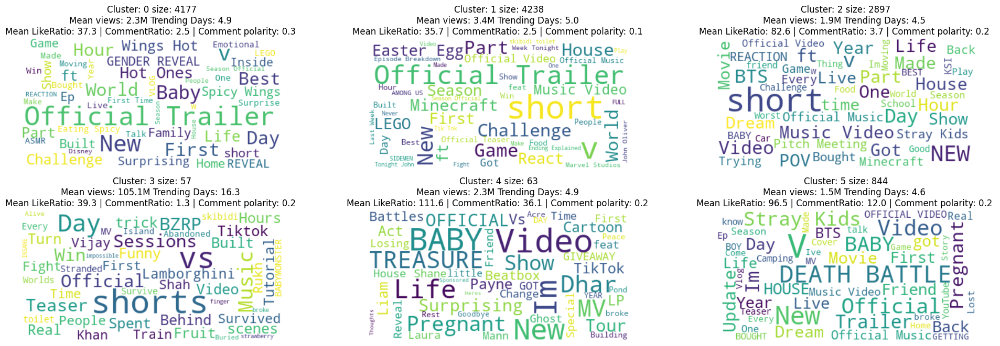

In [94]:
# Determine number of rows and columns dynamically
num_rows = (true_k--1 - 1) // 3 + 1  # 3 columns per row
num_cols = min(true_k, 3)

# Create subplots
plt.figure(figsize=(20, 10))
for k in range(true_k):
    text = agg_result[agg_result.cluster == k]['cleaned_title'].str.cat(sep=' ')
    wordcloud = WordCloud(max_font_size=50, max_words=50, background_color="white").generate(text)

    # Create subplot
    ax = plt.subplot(num_rows, num_cols, k + 1)
    ax.set_title("Cluster " + str(k))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")

    # Annotate with mean and std
    count = agg_result.loc[agg_result['cluster'] == k, 'video_id_count'].values[0]
    mean_views = agg_result.loc[agg_result['cluster'] == k, 'views_mean'].values[0] / 10**6
    
    mean_likeratio = agg_result.loc[agg_result['cluster'] == k, 'LikeRatio1_mean'].values[0]
    mean_commentratio = agg_result.loc[agg_result['cluster'] == k, 'CommentRatio1_mean'].values[0]
    mean_commentpolarity = agg_result.loc[agg_result['cluster'] == k, 'comments_polarity_mean'].values[0]
    mean_trending_days = agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days_mean'].values[0]

    stats_text = f"Mean views: {mean_views:.1f}M Trending Days: {mean_trending_days:.1f} \nMean LikeRatio: {mean_likeratio:.1f} | CommentRatio: {mean_commentratio:.1f} | Comment polarity: {mean_commentpolarity:.1f} "
    ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=12)

plt.tight_layout()
plt.show()